In [1]:
%%bash
rm -r cache
mkdir -p cache


In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'


In [3]:
import gzip
import io
import json
import multiprocessing as mp
import sys

if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

from gql import gql, Client
from gql.transport.requests import RequestsHTTPTransport
from IPython.display import display
from lifelines import ExponentialFitter, KaplanMeierFitter, WeibullFitter
from lifelines.statistics import logrank_test
from maflib.reader import MafReader
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import scipy.stats as stats
import seaborn as sns
import sklearn
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_decision_forests as tfdf
from tqdm.auto import tqdm


2023-01-27 11:20:00.262594: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-27 11:20:02.448492: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-01-27 11:20:02.448529: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-01-27 11:20:15.368598: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-

In [4]:
tf.keras.utils.set_random_seed(1)
tf.config.experimental.enable_op_determinism()


# Data Fetching


In [5]:
# https://gdc.cancer.gov/developers/gdc-application-programming-interface-api
GDC_DATA_ENDPOINT = "https://api.gdc.cancer.gov/v0/data"
GDC_GRAPHQL_READ_ENDPOINT = "https://api.gdc.cancer.gov/v0/graphql"


In [6]:
client = Client(
    transport=RequestsHTTPTransport(url=GDC_GRAPHQL_READ_ENDPOINT),
    fetch_schema_from_transport=True,
)

QUERY = {
  "getCancerGeneCensusTotal": gql(
    """
query getCancerGeneCensusTotal($genes_filters: FiltersArgument) {
  explore {
    genes {
      hits(filters: $genes_filters) {
        total
      }
    }
  }
}
    """),
  "getCancerGeneCensus": gql(
    """
query getCancerGeneCensus($genes_filters: FiltersArgument, $total: Int) {
  explore {
    genes {
      hits(filters: $genes_filters, first: $total) {
        edges {
          node {
            symbol
            synonyms
          }
        }
      }
    }
  }
}
    """),
  "getCasesTotal": gql(
    """
query getCasesTotal($cases_filters: FiltersArgument) {
  repository {
    cases {
      hits(filters: $cases_filters) {
        total
      }
    }
  }
}
    """),
  "getCases": gql(
    """
query getCases(
  $cases_filters: FiltersArgument
  $files_filters: FiltersArgument
  $total_cases: Int
) {
  repository {
    cases {
      hits(filters: $cases_filters, first: $total_cases) {
        edges {
          node {
            case_id
            demographic {
              days_to_death
            }
            diagnoses {
              hits {
                edges {
                  node {
                    days_to_last_follow_up
                  }
                }
              }
            }
            files {
              hits(filters: $files_filters, first: 100) {
                edges {
                  node {
                    file_id
                  }
                }
              }
            }
          }
        }
      }
    }
  }
}
""")
}


In [7]:
GENES_FILTER = {
    "op": "=",
    "content": {
        "field": "is_cancer_gene_census",
        "value": "true",
    },
}

CASES_FILTER = {
    "op": "and",
    "content": [
        {
            "op": "=",
            "content": {
                "field": "disease_type",
                "value": "adenomas and adenocarcinomas",
            },
        },
        {
            "op": "=",
            "content": {
                "field": "samples.sample_type",
                "value": "primary tumor",
            },
        },
        {
            "op": "=",
            "content": {
                "field": "project.project_id",
                "value": "TCGA-LUAD",
            },
        },
        {
            "op": "or",
            "content": [
                {
                    "op": "not",
                    "content": {
                        "field": "demographic.days_to_death",
                        "value": "missing",
                    },
                },
                {
                    "op": "not",
                    "content": {
                        "field": "diagnoses.days_to_last_follow_up",
                        "value": "missing",
                    },
                },
            ],
        },
        {
            "op": "in",
            "content": {
                "field": "files.data_type",
                "value": [
                    "Masked Somatic Mutation",
                ],
            },
        },
    ],
}

FILES_FILTER = {
    "op": "and",
    "content": [
        {
            "op": "in",
            "content": {
                "field": "files.data_type",
                "value": [
                    "Masked Somatic Mutation",
                ],
            },
        },
        {
            "op": "=",
            "content": {
                "field": "files.access",
                "value": "open",
            },
        },
    ],
}


In [8]:
def parse_hits(entry):
    return map(lambda node: node["node"], entry["hits"]["edges"])


In [9]:
def get_cancer_gene_census():
    def get_cancer_gene_census_total():
        params = {"genes_filters": GENES_FILTER}
        result = client.execute(
            QUERY["getCancerGeneCensusTotal"],
            variable_values=params,
            operation_name="getCancerGeneCensusTotal",
        )
        return result["explore"]["genes"]["hits"]["total"]

    params = {"genes_filters": GENES_FILTER, "total": get_cancer_gene_census_total()}
    result = client.execute(
        QUERY["getCancerGeneCensus"],
        variable_values=params,
        operation_name="getCancerGeneCensus",
    )
    return list(set(gene["synonyms"]+[gene["symbol"]]) for gene in parse_hits(result["explore"]["genes"]))


cancer_gene_census = list()

try:
    # raise FileNotFoundError()
    cancer_gene_census = list(set(line.strip().split(';')) for line in open("cache/cgc.txt"))
except (FileNotFoundError) as e:
    cancer_gene_census = get_cancer_gene_census()
    with open("cache/cgc.txt", "w") as outfile:
        outfile.write("\n".join(";".join(name for name in gene) for gene in cancer_gene_census))

print(f"Total genes in cancer_gene_census: {len(cancer_gene_census)} genes")
cancer_gene_census = set().union(*cancer_gene_census)


Total genes in cancer_gene_census: 716 genes


In [10]:
def get_cases():
    def get_cases_total():
        params = {"cases_filters": CASES_FILTER}
        result = client.execute(
            QUERY["getCasesTotal"],
            variable_values=params,
            operation_name="getCasesTotal",
        )
        return result["repository"]["cases"]["hits"]["total"]

    params = {
        "cases_filters": CASES_FILTER,
        "files_filters": FILES_FILTER,
        "total_cases": get_cases_total(),
    }
    result = client.execute(
        QUERY["getCases"],
        variable_values=params,
        operation_name="getCases",
    )
    cases = [
        {
            "case_id": case["case_id"],
            "days_to_death": case["demographic"]["days_to_death"]
            or max(
                diagnosis["days_to_last_follow_up"] or 0
                for diagnosis in parse_hits(case["diagnoses"])
            ),
            "dead": case["demographic"]["days_to_death"] is not None,
            "files": [file_ for file_ in parse_hits(case["files"])],
        }
        for case in parse_hits(result["repository"]["cases"])
    ]
    return cases


cases_records = []

try:
    with open("cache/cases.json", "r") as infile:
        cases_records = json.load(infile)
except (FileNotFoundError, json.JSONDecodeError) as e:
    cases_records = get_cases()
    with open("cache/cases.json", "w") as outfile:
        json.dump(cases_records, outfile)


In [11]:
def parse_mafs(*file_ids):
    mutations = {}
    queue = list(file_ids)
    while queue:
        file_id = queue.pop(0)
        gzip_file = None
        try:
            response = requests.get(f"{GDC_DATA_ENDPOINT}/{file_id}", stream=True)
            bytes_io = io.BytesIO(response.content)
            gzip_file = gzip.GzipFile(fileobj=bytes_io)
        except requests.exceptions.ConnectionError as e:
            print("Connection Error, retrying...")
            queue.append(file_id)
            continue
        text_io = io.TextIOWrapper(gzip_file)
        reader = MafReader(
            lines=(line.rstrip("\r\n") for line in text_io),
            closeable=gzip_file,
        )
        try:
            for record in reader:
                mutations[str(record["Hugo_Symbol"])] = {
                    key: str(value)
                    for key, value in record.items()
                    if key != "Hugo_Symbol"
                }
        except:
            raise
        finally:
            reader.close()
    return mutations


def load_maf(case):
    case["mutations"] = parse_mafs(*(file_["file_id"] for file_ in case["files"]))
    return case


if any("mutations" not in case.keys() for case in cases_records):
    with mp.Pool() as pool:
        cases_records = pool.map(load_maf, cases_records)
    with open("cache/cases.json", "w") as outfile:
        json.dump(cases_records, outfile)


In [12]:
def summarize_mutation(case):
    case["mutated_genes"] = 0
    case["mutated_genes_cgc"] = 0
    for gene, info in case["mutations"].items():
        case[f"mutation_{gene}"] = True
        case["mutated_genes"] += 1
        if gene in cancer_gene_census:
            case["mutated_genes_cgc"] += 1
    return case


if any("mutated_genes" not in case.keys() for case in cases_records):
    cases_records = list(map(summarize_mutation, cases_records))
    with open("cache/cases.json", "w") as outfile:
        json.dump(cases_records, outfile)


In [13]:
cases = pd.DataFrame()
try:
    # raise FileNotFoundError()
    cases = pd.read_csv("cache/cases.csv", index_col="case_id")
except FileNotFoundError as e:
    cases = pd.DataFrame.from_records(
        cases_records,
        index="case_id",
        exclude=["mutations", "files"],
    )
    cases.fillna(
        {column: False for column in cases.columns if column.startswith("mutation_")},
        inplace=True,
    )
    cases.to_csv("cache/cases.csv")
display(cases)


,days_to_death,dead,mutated_genes,mutated_genes_cgc,mutation_KLF17,mutation_GBP3,mutation_COPA,mutation_RYR2,mutation_TAF1B,mutation_LRATD1,...,mutation_CMTM7,mutation_PHAX,mutation_HPS6,mutation_CCDC62,mutation_MIR19B1,mutation_KCTD17,mutation_RPS27,mutation_MACIR,mutation_SLC25A51,mutation_CAPS
case_id,,,,,,,,,,,,,,,,,,,,,
a905d275-9283-4fa6-bbbf-46019bd1bcb7,2360.0,False,108,7,True,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
1427cd18-5ad3-491a-9981-908e31ae49db,1258.0,True,630,42,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
c0e263eb-1a83-4dc8-8abe-3dd2a59bae1b,19.0,True,311,23,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
2fabeb98-05e3-4f55-97f5-fbc675e25a3d,444.0,True,87,8,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
dd63d0fd-e24b-40a5-88c5-7d3d4106631e,652.0,False,404,24,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81a0b2ff-a3d3-41bb-9ce6-765e6ae894af,2488.0,False,512,28,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
aee86a89-0377-4080-b16c-408bfbe78687,411.0,False,804,52,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
4ef872e1-82c9-4939-9248-41ed9d3085b2,826.0,True,189,21,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False


In [14]:
# May add additional filter(s)
cases = cases[cases["dead"]]
cases["days_to_death"] += 1
display(cases)


,days_to_death,dead,mutated_genes,mutated_genes_cgc,mutation_KLF17,mutation_GBP3,mutation_COPA,mutation_RYR2,mutation_TAF1B,mutation_LRATD1,...,mutation_CMTM7,mutation_PHAX,mutation_HPS6,mutation_CCDC62,mutation_MIR19B1,mutation_KCTD17,mutation_RPS27,mutation_MACIR,mutation_SLC25A51,mutation_CAPS
case_id,,,,,,,,,,,,,,,,,,,,,
1427cd18-5ad3-491a-9981-908e31ae49db,1259.0,True,630,42,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
c0e263eb-1a83-4dc8-8abe-3dd2a59bae1b,20.0,True,311,23,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
2fabeb98-05e3-4f55-97f5-fbc675e25a3d,445.0,True,87,8,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
69dba721-a168-47a4-b7ff-80a448bad654,188.0,True,184,10,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
35cb7841-9b09-465a-90c5-e3b8a9faad49,996.0,True,217,16,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32592562-11fa-435a-b40b-2b242bae53aa,1116.0,True,707,43,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
daf0e08e-1738-43f8-874a-b37d79cbe3a7,245.0,True,613,36,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
362000e4-cf7c-48fc-93cc-8f5994b442ea,441.0,True,788,49,False,True,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False


# Statistical Analysis


<Figure size 1000x500 with 0 Axes>

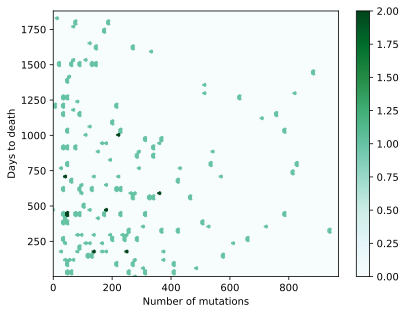

Correlation of determination between Days to Death and Number of Mutated Gene: 0.0004084981523540747


In [15]:
plt.figure(figsize=(10, 5))
cases.plot.hexbin(y="days_to_death", x="mutated_genes")
plt.ylim(
    cases["days_to_death"].quantile(0.00),
    cases["days_to_death"].quantile(0.95),
)
plt.xlim(
    cases["mutated_genes"].quantile(0.00),
    cases["mutated_genes"].quantile(0.95),
)
plt.ylabel("Days to death")
plt.xlabel("Number of mutations")
plt.show()
print(
    f"Correlation of determination between Days to Death and Number of Mutated Gene: {cases['days_to_death'].corr(cases['mutated_genes']) ** 2}"
)


<Figure size 1000x500 with 0 Axes>

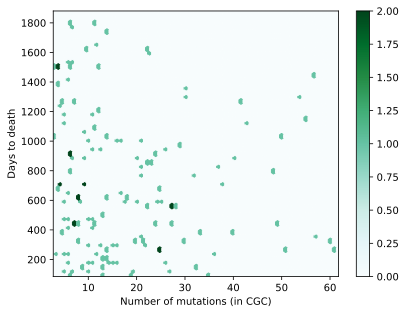

Correlation of determination between Days to Death and Number of Mutated Gene (in cancer gene census): 0.00015373262549586678


In [16]:
plt.figure(figsize=(10, 5))
cases.plot.hexbin(y="days_to_death", x="mutated_genes_cgc")
plt.ylim(
    cases["days_to_death"].quantile(0.05),
    cases["days_to_death"].quantile(0.95),
)
plt.xlim(
    cases["mutated_genes_cgc"].quantile(0.05),
    cases["mutated_genes_cgc"].quantile(0.95),
)
plt.ylabel("Days to death")
plt.xlabel("Number of mutations (in CGC)")
plt.show()
print(
    f"Correlation of determination between Days to Death and Number of Mutated Gene (in cancer gene census): {cases['days_to_death'].corr(cases['mutated_genes_cgc']) ** 2}"
)


In [17]:
kme = KaplanMeierFitter().fit(
    cases["days_to_death"], cases["dead"]
)  # Naive survival function
exp = ExponentialFitter().fit(
    cases["days_to_death"], cases["dead"]
)  # For comparing hazard of each scenerio (constant hazard)
wbf = WeibullFitter().fit(
    cases["days_to_death"], cases["dead"]
)  # Best model according to `lifelines.utils.find_best_parametric_model`


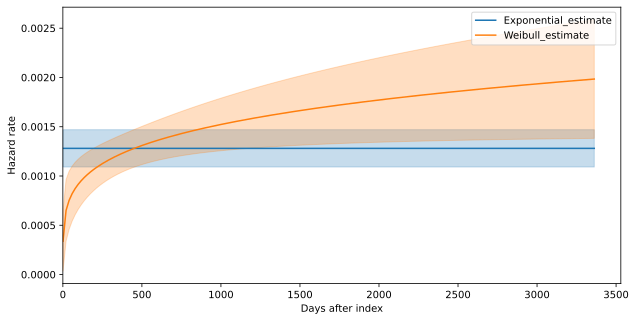

In [18]:
plt.figure(figsize=(10, 5))
exp.plot_hazard()
wbf.plot_hazard()
plt.xlim(0)
plt.xlabel("Days after index")
plt.ylabel("Hazard rate")
plt.legend()
plt.show()


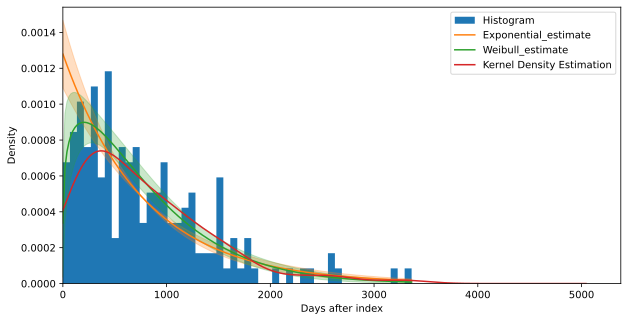

In [19]:
plt.figure(figsize=(10, 5))
cases["days_to_death"].plot.hist(
    bins=50, density=True, histtype="stepfilled", label="Histogram"
)
exp.plot_density()
wbf.plot_density()
cases["days_to_death"].plot.kde(label="Kernel Density Estimation")
plt.xlim(0)
plt.ylim(0)
plt.xlabel("Days after index")
plt.ylabel("Density")
plt.legend()
plt.show()


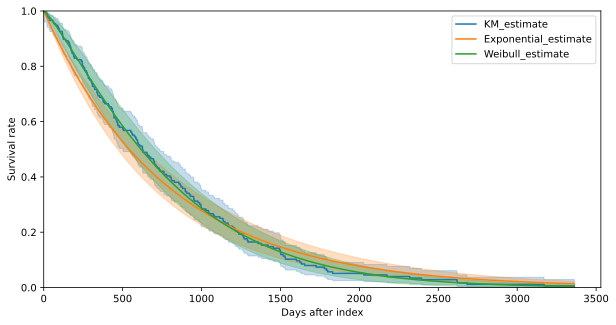

In [20]:
plt.figure(figsize=(10, 5))
kme.plot_survival_function()
exp.plot_survival_function()
wbf.plot_survival_function()
plt.xlim(0)
plt.ylim(0, 1)
plt.xlabel("Days after index")
plt.ylabel("Survival rate")
plt.legend()
plt.show()


In [21]:
cutoff_day = kme.percentile(.5)
print(f"Half-life day (Exact): {cutoff_day}")
print(f"Half-life day (Exponential): {exp.percentile(.5)}")
print(f"Half-life day (Weibull): {wbf.percentile(.5)}")


Half-life day (Exact): 627.0
Half-life day (Exponential): 541.4109680924317
Half-life day (Weibull): 616.1874133820128


In [22]:
genes = []
try:
    # raise FileNotFoundError()
    genes = pd.read_csv("cache/genes.csv", index_col="gene")
except FileNotFoundError as e:
    for mutation in cases.columns:
        if not mutation.startswith("mutation_"):
            continue
        gene = mutation[len("mutation_") :]
        cases_w = cases[cases[mutation]]
        cases_wo = cases[~cases[mutation]]
        info = {}
        info["gene"] = gene
        info["cases"] = len(cases_w)
        if info["cases"] > 1:
            info["hazard_rate"] = (
                ExponentialFitter()
                .fit(cases_w["days_to_death"], cases_w["dead"])
                .hazard_at_times(1.0)[1.0]
            )
        info["p-value"] = logrank_test(
            cases_w["days_to_death"],
            cases_wo["days_to_death"],
            event_observed_A=cases_w["dead"],
            event_observed_B=cases_wo["dead"],
        ).p_value
        genes.append(info)
    genes = pd.DataFrame.from_records(genes).set_index("gene")
    genes.sort_values(by="p-value", inplace=True)
    genes.to_csv("cache/genes.csv")

display(genes)


,cases,hazard_rate,p-value
gene,,,
SLC39A9,1,NaN,5.986964e-40
NRIP2,1,NaN,5.986964e-40
EDDM3B,1,NaN,5.986964e-40
RAD51AP1,1,NaN,5.986964e-40
CTCF,1,NaN,5.986964e-40
...,...,...,...
SOX12,0,NaN,NaN
RPS27,0,NaN,NaN
MACIR,0,NaN,NaN


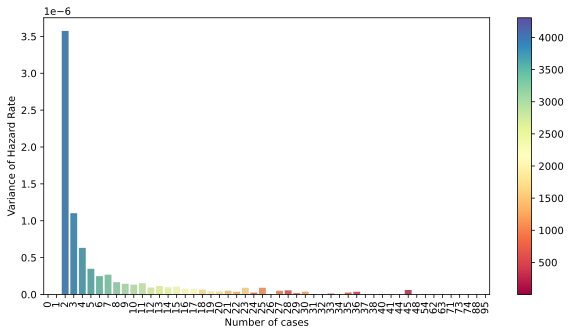

In [23]:
df = (
        pd.DataFrame(
            [
                genes.groupby("cases")["hazard_rate"]
                .var()
                .rename("Variance of Hazard Rate"),
                genes.groupby("cases").size().rename("Number of genes"),
            ]
        )
        .transpose()
        .rename_axis("Number of cases")
        .reset_index()
    )
norm = plt.Normalize(df["Number of genes"].max(), df["Number of genes"].min())
sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
sm.set_array([])
plt.figure(figsize=(10, 5))
sns.barplot(
    df,
    x="Number of cases",
    y="Variance of Hazard Rate",
    hue="Number of genes",
    dodge=False,
    palette="Spectral",
)
plt.xticks(rotation=90)
plt.legend().remove()
plt.colorbar(sm, ax=plt.gca())
plt.show()


In [24]:
genes = genes[genes["cases"] > 7]
display(genes[genes.index.isin(cancer_gene_census)].index)


Index(['POLQ', 'PRKCB', 'RUNX1T1', 'STK11', 'HK3', 'EPHA3', 'KMT2D', 'KRAS',
       'SND1', 'NTRK3',
       ...
       'MED12', 'IL7R', 'WRN', 'PIK3CA', 'TPR', 'BCL11B', 'GNAS', 'SPEN',
       'RB1', 'FLNA'],
      dtype='object', name='gene', length=122)

In [25]:
print(
    f"Genes hazard rate: {genes['hazard_rate'].mean()} +/- {3*genes['hazard_rate'].std()}"
)


Genes hazard rate: 0.00134604308007421 +/- 0.0010467732850822668


In [26]:
def show(genes): 
    print(
        ", ".join(gene for gene in genes)
    )
    print(len(genes))
    pass

print("All genes:")
show(genes[genes["p-value"] < 0.05].sort_values(by="p-value").index)
print("Genes in CGC:")
show(genes[genes.index.isin(cancer_gene_census)][
        genes["p-value"] < 0.05
    ].index)


All genes:
MAP1B, PCDHB9, TMEM132B, NLRP12, USP34, CRB1, NPC1L1, NXF5, PLXNA2, ZIC1, CFAP54, ICE1, MUC2, BNC2, POLQ, SLC26A7, EPB41L3, FPGT-TNNI3K, CDH19, COL22A1, ITIH6, SH3TC2, MYH7, IL16, KLHL4, AGRN, OR5L2, PRKCB, SLC14A2, FSCB, SLC17A6, ACTRT2, RUNX1T1, SEZ6L, STK11, RUVBL1, HK3, UTP20, EPHA3, PADI3, ATP2B2, MYOCD, OR4A5, SLC9A4, KMT2D, KCNU1, LAMA1, MYO18B, CDH6, KRAS, GP2, SND1, KIF5A, CNTN2, AKAP3, KCNB1, IGSF1, PLXNA4, NTRK3, CMTR2, BRINP3, CHD5, NLRP13, TMEM132D, NAT10, ABCC9, PHF20L1, PCNT, CDH12, XKR7, PDZRN3, MASP1, PPP1R3A, SYTL2, KMT2A, PCDHB8, SPAG17, P2RY10, BCORL1, ABCA13, PCDHGA3, ZSWIM2, OR11H1, BCHE, OR2T1, USP6, OR5W2, POU3F4
88
Genes in CGC:
POLQ, PRKCB, RUNX1T1, STK11, HK3, EPHA3, KMT2D, KRAS, SND1, NTRK3, KMT2A, BCORL1, USP6
13


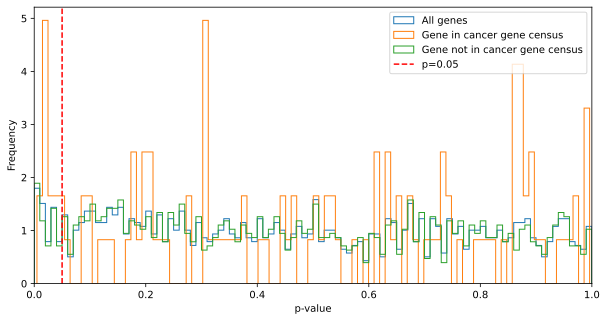

In [27]:
plt.figure(figsize=(10, 5))
genes["p-value"].plot.hist(
    bins=100, density=True, histtype="step", label="All genes"
)
genes[genes.index.isin(cancer_gene_census)]["p-value"].plot.hist(
    bins=100, density=True, histtype="step", label="Gene in cancer gene census"
)
genes[~genes.index.isin(cancer_gene_census)]["p-value"].plot.hist(
    bins=100, density=True, histtype="step", label="Gene not in cancer gene census"
)
plt.xlim(0, 1)
plt.xlabel("p-value")
plt.axvline(x=0.05, label="p=0.05", color="red", linestyle="--")
plt.legend()
plt.show()


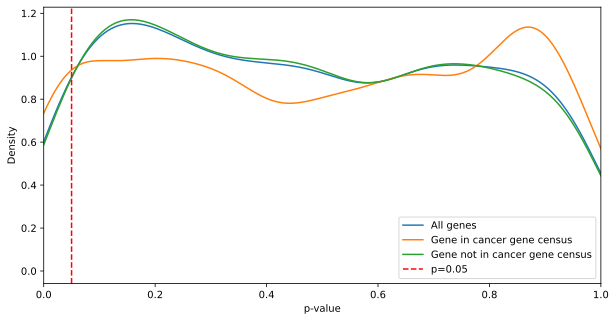

In [28]:
plt.figure(figsize=(10, 5))
bandwidth = len(genes) ** (-1 / (4 + 1))
genes["p-value"].plot.kde(bw_method=bandwidth, label="All genes")
genes[genes.index.isin(cancer_gene_census)]["p-value"].plot.kde(
    bw_method=bandwidth,
    label="Gene in cancer gene census",
)
genes[~genes.index.isin(cancer_gene_census)]["p-value"].plot.kde(
    bw_method=bandwidth,
    label="Gene not in cancer gene census",
)
plt.xlim(0, 1)
plt.xlabel("p-value")
plt.axvline(x=0.05, label="p=0.05", color="red", linestyle="--")
plt.legend()
plt.show()


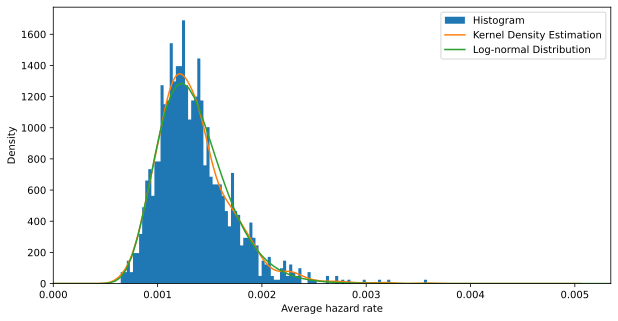

In [29]:
plt.figure(figsize=(10, 5))
genes["hazard_rate"].plot.hist(
    bins=100, density=True, histtype="stepfilled", label="Histogram"
)
genes["hazard_rate"].plot.kde(label="Kernel Density Estimation")
xmin, xmax = plt.xlim(0)
xs = np.linspace(xmin, xmax, 100)
plt.plot(
    xs,
    stats.lognorm.pdf(
        xs, *stats.lognorm.fit(genes["hazard_rate"].to_numpy(), floc=0)
    ),
    label="Log-normal Distribution",
)
plt.xlabel("Average hazard rate")
plt.legend()
plt.show()


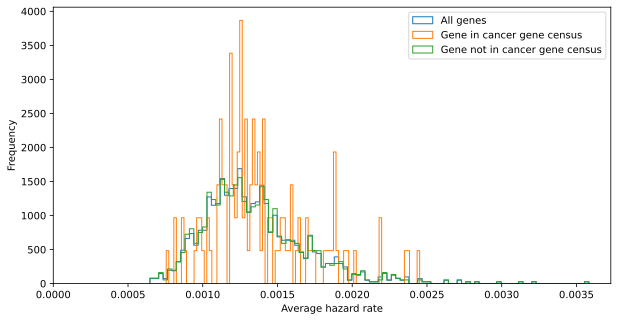

In [30]:
plt.figure(figsize=(10, 5))
genes["hazard_rate"].plot.hist(
    bins=100, density=True, histtype="step", label="All genes"
)
genes[genes.index.isin(cancer_gene_census)]["hazard_rate"].plot.hist(
    bins=100, density=True, histtype="step", label="Gene in cancer gene census"
)
genes[~genes.index.isin(cancer_gene_census)]["hazard_rate"].plot.hist(
    bins=100, density=True, histtype="step", label="Gene not in cancer gene census"
)
plt.xlim(0)
plt.xlabel("Average hazard rate")
plt.legend()
plt.show()


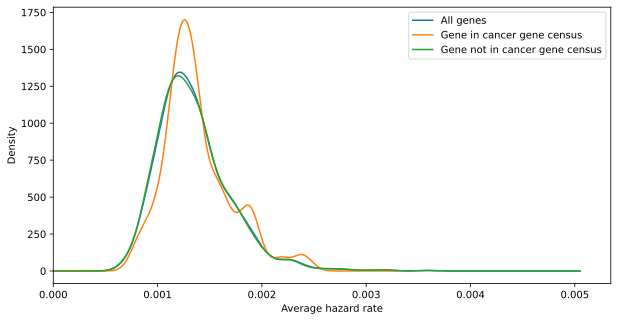

In [31]:
plt.figure(figsize=(10, 5))
bandwidth = len(genes) ** (-1 / (4 + 1))
genes["hazard_rate"].plot.kde(bw_method=bandwidth, label="All genes")
genes[genes.index.isin(cancer_gene_census)]["hazard_rate"].plot.kde(
    bw_method=bandwidth,
    label="Gene in cancer gene census",
)
genes[~genes.index.isin(cancer_gene_census)]["hazard_rate"].plot.kde(
    bw_method=bandwidth,
    label="Gene not in cancer gene census",
)
plt.xlim(0)
plt.xlabel("Average hazard rate")
plt.legend()
plt.show()


In [32]:
genes_pair = None
try:
    # raise FileNotFoundError()
    genes_pair = pd.read_csv("cache/genes_pair.csv", index_col=0)
except FileNotFoundError as e:
    genes_label = (
        genes[(genes["cases"] > 7) & genes["hazard_rate"].notnull()]
        .filter(
            items=filter(lambda gene: gene in cancer_gene_census, genes.index), axis="index"
        )
        .sort_index()
        .sort_values("cases")
        .sort_values("hazard_rate")
        .index.unique()
    )

    genes_pair = [[None for gene_b in genes_label] for gene_a in genes_label]

    with tqdm(total=len(genes_label) ** 2) as pbar:
        for i, gene_a in enumerate(genes_label):
            for j, gene_b in enumerate(genes_label):
                if i < j:
                    cases_masked = cases[
                        cases[f"mutation_{gene_a}"]
                        & cases[f"mutation_{gene_b}"]
                    ]
                    if len(cases_masked) > 1:
                        genes_pair[i][j] = (
                            ExponentialFitter()
                            .fit(cases_masked["days_to_death"], cases_masked["dead"])
                            .hazard_at_times(1.0)[1.0]
                        )
                if i == j:
                    genes_pair[i][i] = genes["hazard_rate"][gene_a]
                if i > j:
                    genes_pair[i][j] = genes_pair[j][i]
                pbar.update(1)

    genes_pair = pd.DataFrame(genes_pair)
    genes_pair.columns = genes_label
    genes_pair.index = genes_label

    genes_pair.to_csv("cache/genes_pair.csv")

print(f"Total genes: {len(genes_pair.columns)}")
print(
    f"Total genes in cancer gene census: {len(list(filter(lambda gene: gene in cancer_gene_census, genes_pair.columns)))}"
)
display(genes_pair)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 14884/14884 [02:01<00:00, 122.36it/s]


Total genes: 122
Total genes in cancer gene census: 122


gene,POLQ,USP6,EPHA3,PTPRC,POT1,KMT2A,ATRX,BRCA2,RANBP2,AMER1,...,BCORL1,NCOR2,KMT2D,NIN,TCF12,TBX3,PRKCB,SND1,RUNX1T1,HK3
gene,,,,,,,,,,,,,,,,,,,,,
POLQ,0.000756,0.000334,0.000626,0.000587,NaN,0.000429,0.000415,0.000581,0.000415,0.000709,...,0.001493,0.000648,0.002286,NaN,NaN,NaN,0.001986,NaN,0.002049,0.001245
USP6,0.000334,0.000816,0.000583,NaN,NaN,0.000471,0.000480,NaN,0.000552,NaN,...,NaN,0.002041,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EPHA3,0.000626,0.000583,0.000823,0.000566,NaN,0.000687,0.000884,NaN,0.000695,0.000927,...,NaN,0.001151,0.002007,NaN,0.001832,NaN,0.002028,0.001375,0.002105,NaN
PTPRC,0.000587,NaN,0.000566,0.000863,NaN,0.000621,0.001327,NaN,NaN,0.000880,...,NaN,NaN,0.001487,NaN,NaN,0.001103,0.001268,NaN,NaN,NaN
POT1,NaN,NaN,NaN,NaN,0.000867,NaN,0.000530,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TBX3,NaN,NaN,NaN,0.001103,NaN,NaN,NaN,NaN,NaN,0.001153,...,NaN,NaN,NaN,NaN,0.011429,0.002182,0.003817,NaN,NaN,NaN
PRKCB,0.001986,NaN,0.002028,0.001268,NaN,0.001292,0.002286,NaN,NaN,0.001566,...,0.002442,NaN,NaN,NaN,0.002227,0.003817,0.002184,0.002591,0.002541,NaN
SND1,NaN,NaN,0.001375,NaN,NaN,NaN,0.002286,NaN,0.003745,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.002591,0.002352,0.002541,0.001382


In [33]:
plt.figure()
sns.heatmap(
    genes_pair,
    square=True,
    vmin=genes_pair.stack().quantile(0.1),
    vmax=genes_pair.stack().quantile(0.9),
    center=ExponentialFitter()
    .fit(cases["days_to_death"], cases["dead"])
    .hazard_at_times(1.0)[1.0],
    cmap="RdBu_r",
).set_facecolor('black')
plt.show()


In [34]:
genes_pair.fillna(
    exp.hazard_at_times(1.0)[1.0],
    inplace=True,
)


In [35]:
plt.figure()
sns.clustermap(
    genes_pair,
    vmin=genes_pair.stack().quantile(0.1),
    vmax=genes_pair.stack().quantile(0.9),
    center=ExponentialFitter()
    .fit(cases["days_to_death"], cases["dead"])
    .hazard_at_times(1.0)[1.0],
    cmap="RdBu_r",
)
plt.show()


<Figure size 640x480 with 0 Axes>

# Machine Learning


## Common Configuration


In [36]:
metrics = [
    tf.keras.metrics.TruePositives(name="tp"),
    tf.keras.metrics.FalsePositives(name="fp"),
    tf.keras.metrics.TrueNegatives(name="tn"),
    tf.keras.metrics.FalseNegatives(name="fn"),
    tf.keras.metrics.BinaryAccuracy(name="accuracy"),
    tf.keras.metrics.Precision(name="precision"),
    tf.keras.metrics.Recall(name="recall"),
    tf.keras.metrics.AUC(name="auc", curve="roc"),
    tf.keras.metrics.AUC(name="prc", curve="PR"),
]


2023-01-27 11:40:02.001384: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-01-27 11:40:02.001796: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-01-27 11:40:02.002065: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2023-01-27 11:40:02.002324: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2023-01-27 11:40:02.002586: W tensorf

In [37]:
def plot_cm(
    labels,
    predictions,
    p=0.5,
    label_name="Actual label",
    prediction_name="Predicted label",
):
    cm = confusion_matrix(labels, predictions > p)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm, annot=True, fmt="d")
    # plt.title(f"Confusion matrix @{p:.2f}")
    plt.ylabel(label_name)
    plt.xlabel(prediction_name)

    print(f"True Negatives: {cm[0][0]}")
    print(f"False Positives: {cm[0][1]}")
    print(f"False Negatives: {cm[1][0]}")
    print(f"True Positives: {cm[1][1]}")
    print(f"Total Actual Positive: {np.sum(cm[1])}")


In [38]:
def plot_roc(name, labels, predictions, plot_area=False, area_kwargs={}, **kwargs):
    fp, tp, _ = sklearn.metrics.roc_curve(labels, predictions)

    plt.plot(fp * 100, tp * 100, label=name, linewidth=2, **kwargs)
    if plot_area:
        plt.fill_between(fp * 100, tp * 100, **area_kwargs)
    # plt.title("ROC")
    plt.xlabel("False positives")
    plt.ylabel("True positives")
    plt.xlim([-0.5, 100.5])
    plt.ylim([-0.5, 100.5])
    plt.grid(True)
    ax = plt.gca()
    ax.xaxis.set_major_formatter(matplotlib.ticker.PercentFormatter())
    ax.yaxis.set_major_formatter(matplotlib.ticker.PercentFormatter())
    ax.set_aspect("equal")

    return sklearn.metrics.roc_auc_score(labels, predictions)


In [39]:
def interpret_auc(auc):
    if auc < 0.5:
        print(f"Note: Invalid result")
    if max(auc, 1 - auc) < 0.7:
        print(f"Interpretation: poor discrimination")
    elif max(auc, 1 - auc) < 0.8:
        print(f"Interpretation: acceptable discrimination")
    elif max(auc, 1 - auc) < 0.9:
        print(f"Interpretation: excellent discrimination")
    else:
        print(f"Interpretation: outstanding discrimination")


In [40]:
def plot_prc(name, labels, predictions, plot_area=False, area_kwargs={}, **kwargs):
    precision, recall, _ = sklearn.metrics.precision_recall_curve(labels, predictions)

    plt.plot(precision * 100, recall * 100, label=name, linewidth=2, **kwargs)
    if plot_area:
        plt.fill_betweenx(recall * 100, precision * 100, **area_kwargs)
    # plt.title("Precision-Recall Curve")
    plt.xlabel("Precision")
    plt.ylabel("Recall")
    plt.xlim([-0.5, 100.5])
    plt.ylim([-0.5, 100.5])
    plt.grid(True)
    ax = plt.gca()
    ax.xaxis.set_major_formatter(matplotlib.ticker.PercentFormatter())
    ax.yaxis.set_major_formatter(matplotlib.ticker.PercentFormatter())
    ax.set_aspect("equal")

    return sklearn.metrics.average_precision_score(labels, predictions)


In [41]:
results = {}


## Prepare dataset


In [42]:
dataset_df = cases.filter(
    items=[f"mutation_{gene}" for gene in cancer_gene_census]
)
dataset_df *= 1
dataset_df["survive_imbalance"] = cases["days_to_death"] > 2 * cutoff_day
dataset_df["survive_balance"] = cases["days_to_death"] > cutoff_day
dataset_df = dataset_df.reindex(sorted(dataset_df.columns), axis=1)
display(dataset_df)


,mutation_A1CF,mutation_ABI1,mutation_ABL1,mutation_ABL2,mutation_ACKR3,mutation_ACSL3,mutation_ACSL6,mutation_ACVR1,mutation_ACVR2A,mutation_AFDN,...,mutation_ZMYM3,mutation_ZNF331,mutation_ZNF384,mutation_ZNF429,mutation_ZNF479,mutation_ZNF521,mutation_ZNRF3,mutation_ZRSR2,survive_balance,survive_imbalance
case_id,,,,,,,,,,,,,,,,,,,,,
1427cd18-5ad3-491a-9981-908e31ae49db,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,True,True
c0e263eb-1a83-4dc8-8abe-3dd2a59bae1b,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,False,False
2fabeb98-05e3-4f55-97f5-fbc675e25a3d,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,False,False
69dba721-a168-47a4-b7ff-80a448bad654,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,False,False
35cb7841-9b09-465a-90c5-e3b8a9faad49,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32592562-11fa-435a-b40b-2b242bae53aa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,True,False
daf0e08e-1738-43f8-874a-b37d79cbe3a7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,False,False
362000e4-cf7c-48fc-93cc-8f5994b442ea,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,False,False


In [43]:
labels = ["survive_imbalance", "survive_balance"]

train_df, test_df = train_test_split(dataset_df, test_size=0.2)

train_labels = np.array(train_df[labels].copy())
train_features = np.array(train_df.drop(labels, axis=1))

test_labels = np.array(test_df[labels].copy())
test_features = np.array(test_df.drop(labels, axis=1))

print(f"Training labels shape: {train_labels.shape}")
print(f"Test labels shape: {test_labels.shape}")
print(f"Training features shape: {train_features.shape}")
print(f"Test features shape: {test_features.shape}")


Training labels shape: (140, 2)
Test labels shape: (36, 2)
Training features shape: (140, 709)
Test features shape: (36, 709)


True Negatives: 71
False Positives: 40
False Negatives: 0
True Positives: 29
Total Actual Positive: 29


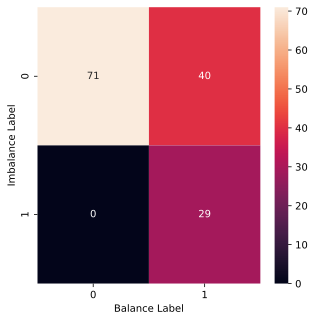

In [44]:
plot_cm(
    train_labels[:, 0],
    train_labels[:, 1],
    label_name="Imbalance Label",
    prediction_name="Balance Label",
)
plt.show()


## Imbalance Labeling, Random Forest


### Training


In [45]:
model = tfdf.keras.RandomForestModel(task=tfdf.keras.Task.CLASSIFICATION)
model.compile(metrics=metrics)


Use /tmp/tmpha1gin_n as temporary training directory


In [46]:
history = model.fit(
    x=train_features,
    y=train_labels[:, 0],
    validation_data=(test_features, test_labels[:, 0]),
)


Reading training dataset...
Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Training dataset read in 0:00:07.305528. Found 140 examples.
Reading validation dataset...
Num validation examples: tf.Tensor(36, shape=(), dtype=int32)
Validation dataset read in 0:00:05.262481. Found 36 examples.
Training model...
Model trained in 0:00:00.219955
Compiling model...


[INFO 2023-01-27T11:40:15.170244972+07:00 kernel.cc:1175] Loading model from path /tmp/tmpha1gin_n/model/ with prefix df268817b57e4d30
[INFO 2023-01-27T11:40:15.186040236+07:00 abstract_model.cc:1306] Engine "RandomForestOptPred" built
[INFO 2023-01-27T11:40:15.18618432+07:00 kernel.cc:1021] Use fast generic engine


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Model compiled.


### Evaluation


In [47]:
train_predictions = model.predict(train_features)
train_evaluation = model.evaluate(
    x=train_features, y=train_labels[:, 0], return_dict=True
)
for name, value in train_evaluation.items():
    print(f"{name} : {value}")


5/5 [==============================] - 1s 8ms/step - loss: 0.0000e+00 - tp: 10.0000 - fp: 0.0000e+00 - tn: 111.0000 - fn: 19.0000 - accuracy: 0.8643 - precision: 1.0000 - recall: 0.3448 - auc: 0.9616 - prc: 0.9213
loss : 0.0
tp : 10.0
fp : 0.0
tn : 111.0
fn : 19.0
accuracy : 0.8642857074737549
precision : 1.0
recall : 0.3448275923728943
auc : 0.9616340398788452
prc : 0.9213331341743469


In [48]:
test_predictions = model.predict(test_features)
test_evaluation = model.evaluate(x=test_features, y=test_labels[:, 0], return_dict=True)
for name, value in test_evaluation.items():
    print(f"{name} : {value}")


2/2 [==============================] - 1s 13ms/step - loss: 0.0000e+00 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 31.0000 - fn: 5.0000 - accuracy: 0.8611 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.3710 - prc: 0.1035
loss : 0.0
tp : 0.0
fp : 0.0
tn : 31.0
fn : 5.0
accuracy : 0.8611111044883728
precision : 0.0
recall : 0.0
auc : 0.3709677457809448
prc : 0.10350081324577332


True Negatives: 111
False Positives: 0
False Negatives: 19
True Positives: 10
Total Actual Positive: 29


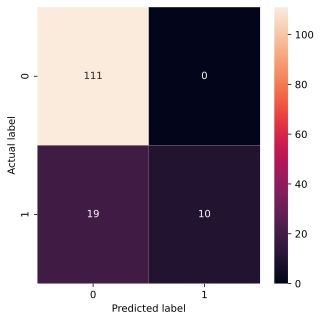

True Negatives: 31
False Positives: 0
False Negatives: 5
True Positives: 0
Total Actual Positive: 5


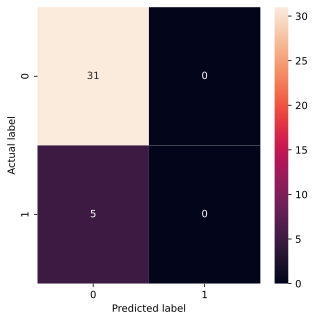

In [49]:
plot_cm(train_labels[:, 0], train_predictions)
plt.show()

plot_cm(test_labels[:, 0], test_predictions)
plt.show()


In [50]:
results["Random Forest - Imbalance"] = {
    "train": {
        "predictions": train_predictions,
        "evaluation": train_evaluation,
    },
    "test": {
        "predictions": test_predictions,
        "evaluation": test_evaluation,
    },
}


## Imbalance Labeling, Feedforward Neural Network


### Training


In [51]:
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(np.array(train_features))
model = tf.keras.Sequential(
    [
        normalizer,
        tf.keras.layers.Dense(
            100, kernel_regularizer=tf.keras.regularizers.l2(0.0001), activation="relu"
        ),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(
            100, kernel_regularizer=tf.keras.regularizers.l2(0.0001), activation="relu"
        ),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(
            100, kernel_regularizer=tf.keras.regularizers.l2(0.0001), activation="relu"
        ),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation="sigmoid"),
    ]
)
model.compile(metrics=metrics, loss="BinaryCrossentropy")


In [52]:
history = model.fit(
    x=train_features,
    y=train_labels[:, 0],
    validation_data=(test_features, test_labels[:, 0]),
)


5/5 [==============================] - 1s 94ms/step - loss: 0.7262 - tp: 9.0000 - fp: 21.0000 - tn: 121.0000 - fn: 25.0000 - accuracy: 0.7386 - precision: 0.3000 - recall: 0.2647 - auc: 0.5643 - prc: 0.2941 - val_loss: 48345.4297 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 31.0000 - val_fn: 5.0000 - val_accuracy: 0.8611 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.4484 - val_prc: 0.1165


### Evaluation


In [53]:
train_predictions = model.predict(train_features)
train_evaluation = model.evaluate(
    x=train_features, y=train_labels[:, 0], return_dict=True
)
for name, value in train_evaluation.items():
    print(f"{name} : {value}")


5/5 [==============================] - 0s 3ms/step - loss: 0.5442 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 111.0000 - fn: 29.0000 - accuracy: 0.7929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.6336 - prc: 0.3470
loss : 0.5442001819610596
tp : 0.0
fp : 0.0
tn : 111.0
fn : 29.0
accuracy : 0.7928571701049805
precision : 0.0
recall : 0.0
auc : 0.633581817150116
prc : 0.3469541072845459


In [54]:
test_predictions = model.predict(test_features)
test_evaluation = model.evaluate(x=test_features, y=test_labels[:, 0], return_dict=True)
for name, value in test_evaluation.items():
    print(f"{name} : {value}")


2/2 [==============================] - 0s 9ms/step - loss: 48345.4297 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 31.0000 - fn: 5.0000 - accuracy: 0.8611 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4484 - prc: 0.1165
loss : 48345.4296875
tp : 0.0
fp : 0.0
tn : 31.0
fn : 5.0
accuracy : 0.8611111044883728
precision : 0.0
recall : 0.0
auc : 0.44838711619377136
prc : 0.11650775372982025


True Negatives: 111
False Positives: 0
False Negatives: 29
True Positives: 0
Total Actual Positive: 29


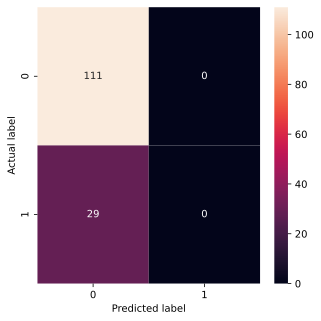

True Negatives: 31
False Positives: 0
False Negatives: 5
True Positives: 0
Total Actual Positive: 5


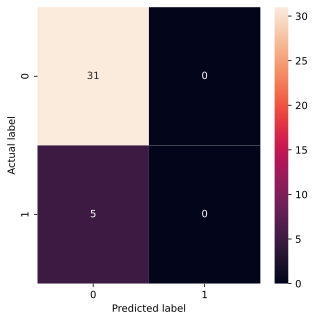

In [55]:
plot_cm(train_labels[:, 0], train_predictions)
plt.show()

plot_cm(test_labels[:, 0], test_predictions)
plt.show()


In [56]:
results["Deep Feed Forward - Imbalance"] = {
    "train": {
        "predictions": train_predictions,
        "evaluation": train_evaluation,
    },
    "test": {
        "predictions": test_predictions,
        "evaluation": test_evaluation,
    },
}


## Balance Labeling, Random Forest


### Training


In [57]:
model = tfdf.keras.RandomForestModel(task=tfdf.keras.Task.CLASSIFICATION)
model.compile(metrics=metrics)


Use /tmp/tmpguy5u3l9 as temporary training directory


In [58]:
history = model.fit(
    x=train_features,
    y=train_labels[:, 0],
    validation_data=(test_features, test_labels[:, 0]),
)


Reading training dataset...
Training dataset read in 0:00:05.470750. Found 140 examples.
Reading validation dataset...
Num validation examples: tf.Tensor(36, shape=(), dtype=int32)
Validation dataset read in 0:00:04.837500. Found 36 examples.
Training model...
Model trained in 0:00:00.172763
Compiling model...


[INFO 2023-01-27T11:40:42.57601848+07:00 kernel.cc:1175] Loading model from path /tmp/tmpguy5u3l9/model/ with prefix a4318636b7d54f48
[INFO 2023-01-27T11:40:42.583881579+07:00 abstract_model.cc:1306] Engine "RandomForestOptPred" built
[INFO 2023-01-27T11:40:42.584033137+07:00 kernel.cc:1021] Use fast generic engine


Model compiled.


### Evaluation


In [59]:
train_predictions = model.predict(train_features)
train_evaluation = model.evaluate(
    x=train_features, y=train_labels[:, 1], return_dict=True
)
for name, value in train_evaluation.items():
    print(f"{name} : {value}")


5/5 [==============================] - 1s 5ms/step


5/5 [==============================] - 1s 7ms/step - loss: 0.0000e+00 - tp: 10.0000 - fp: 0.0000e+00 - tn: 71.0000 - fn: 59.0000 - accuracy: 0.5786 - precision: 1.0000 - recall: 0.1449 - auc: 0.7166 - prc: 0.7777
loss : 0.0
tp : 10.0
fp : 0.0
tn : 71.0
fn : 59.0
accuracy : 0.5785714387893677
precision : 1.0
recall : 0.14492753148078918
auc : 0.7165747880935669
prc : 0.7777467370033264


In [60]:
test_predictions = model.predict(test_features)
test_evaluation = model.evaluate(x=test_features, y=test_labels[:, 1], return_dict=True)
for name, value in test_evaluation.items():
    print(f"{name} : {value}")


2/2 [==============================] - 1s 6ms/step


2/2 [==============================] - 1s 13ms/step - loss: 0.0000e+00 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 18.0000 - fn: 18.0000 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5046 - prc: 0.6035
loss : 0.0
tp : 0.0
fp : 0.0
tn : 18.0
fn : 18.0
accuracy : 0.5
precision : 0.0
recall : 0.0
auc : 0.5046296119689941
prc : 0.6035466194152832


True Negatives: 71
False Positives: 0
False Negatives: 59
True Positives: 10
Total Actual Positive: 69


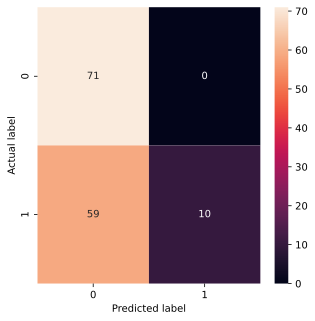

True Negatives: 18
False Positives: 0
False Negatives: 18
True Positives: 0
Total Actual Positive: 18


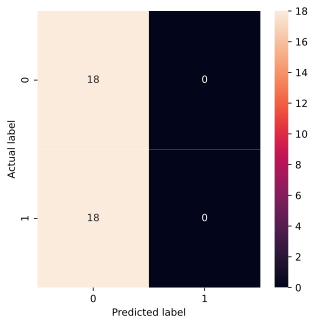

In [61]:
plot_cm(train_labels[:, 1], train_predictions)
plt.show()

plot_cm(test_labels[:, 1], test_predictions)
plt.show()


In [62]:
results["Random Forest - Balance"] = {
    "train": {
        "predictions": train_predictions,
        "evaluation": train_evaluation,
    },
    "test": {
        "predictions": test_predictions,
        "evaluation": test_evaluation,
    },
}


## Balance Labeling, Feedforward Neural Network


### Training


In [63]:
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(np.array(train_features))
model = tf.keras.Sequential(
    [
        normalizer,
        tf.keras.layers.Dense(
            100, kernel_regularizer=tf.keras.regularizers.l2(0.0001), activation="relu"
        ),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(
            100, kernel_regularizer=tf.keras.regularizers.l2(0.0001), activation="relu"
        ),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(
            100, kernel_regularizer=tf.keras.regularizers.l2(0.0001), activation="relu"
        ),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation="sigmoid"),
    ]
)
model.compile(metrics=metrics, loss="BinaryCrossentropy")


In [64]:
history = model.fit(
    x=train_features,
    y=train_labels[:, 1],
    validation_data=(test_features, test_labels[:, 1]),
)


5/5 [==============================] - 1s 85ms/step - loss: 0.8887 - tp: 34.0000 - fp: 37.0000 - tn: 52.0000 - fn: 53.0000 - accuracy: 0.4886 - precision: 0.4789 - recall: 0.3908 - auc: 0.5054 - prc: 0.4857 - val_loss: 37933.5742 - val_tp: 13.0000 - val_fp: 12.0000 - val_tn: 6.0000 - val_fn: 5.0000 - val_accuracy: 0.5278 - val_precision: 0.5200 - val_recall: 0.7222 - val_auc: 0.5324 - val_prc: 0.5118


### Evaluation


In [65]:
train_predictions = model.predict(train_features)
train_evaluation = model.evaluate(
    x=train_features, y=train_labels[:, 1], return_dict=True
)
for name, value in train_evaluation.items():
    print(f"{name} : {value}")


5/5 [==============================] - 0s 3ms/step - loss: 0.7045 - tp: 42.0000 - fp: 32.0000 - tn: 39.0000 - fn: 27.0000 - accuracy: 0.5786 - precision: 0.5676 - recall: 0.6087 - auc: 0.6258 - prc: 0.5916
loss : 0.7045217156410217
tp : 42.0
fp : 32.0
tn : 39.0
fn : 27.0
accuracy : 0.5785714387893677
precision : 0.5675675868988037
recall : 0.6086956262588501
auc : 0.6258419752120972
prc : 0.5916275978088379


In [66]:
test_predictions = model.predict(test_features)
test_evaluation = model.evaluate(x=test_features, y=test_labels[:, 1], return_dict=True)
for name, value in test_evaluation.items():
    print(f"{name} : {value}")


2/2 [==============================] - 0s 9ms/step - loss: 37933.5742 - tp: 13.0000 - fp: 12.0000 - tn: 6.0000 - fn: 5.0000 - accuracy: 0.5278 - precision: 0.5200 - recall: 0.7222 - auc: 0.5324 - prc: 0.5118
loss : 37933.57421875
tp : 13.0
fp : 12.0
tn : 6.0
fn : 5.0
accuracy : 0.5277777910232544
precision : 0.5199999809265137
recall : 0.7222222089767456
auc : 0.5324074625968933
prc : 0.5118248462677002


True Negatives: 39
False Positives: 32
False Negatives: 27
True Positives: 42
Total Actual Positive: 69


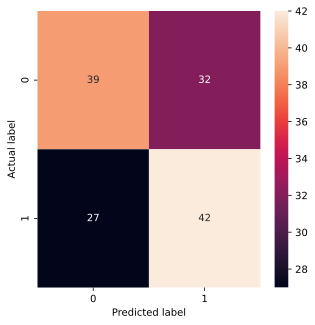

True Negatives: 6
False Positives: 12
False Negatives: 5
True Positives: 13
Total Actual Positive: 18


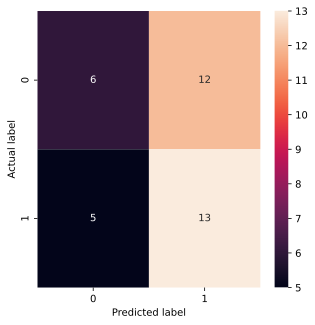

In [67]:
plot_cm(train_labels[:, 1], train_predictions)
plt.show()

plot_cm(test_labels[:, 1], test_predictions)
plt.show()


In [68]:
results["Deep Feed Forward - Balance"] = {
    "train": {
        "predictions": train_predictions,
        "evaluation": train_evaluation,
    },
    "test": {
        "predictions": test_predictions,
        "evaluation": test_evaluation,
    },
}


## Comparison


Random Forest - Imbalance: Training Area Under ROC Curve: 0.9616340398788452 / 0.9613233923578752
Interpretation: outstanding discrimination
Random Forest - Imbalance: Testing Area Under ROC Curve: 0.3709677457809448 / 0.3709677419354839
Note: Invalid result
Interpretation: poor discrimination
Deep Feed Forward - Imbalance: Training Area Under ROC Curve: 0.633581817150116 / 0.6337371854613234
Interpretation: poor discrimination
Deep Feed Forward - Imbalance: Testing Area Under ROC Curve: 0.44838711619377136 / 0.45161290322580644
Note: Invalid result
Interpretation: poor discrimination
Random Forest - Balance: Training Area Under ROC Curve: 0.7165747880935669 / 0.7158603796693203
Interpretation: acceptable discrimination
Random Forest - Balance: Testing Area Under ROC Curve: 0.5046296119689941 / 0.5092592592592593
Interpretation: poor discrimination
Deep Feed Forward - Balance: Training Area Under ROC Curve: 0.6258419752120972 / 0.6269646866707491
Interpretation: poor discrimination
Dee

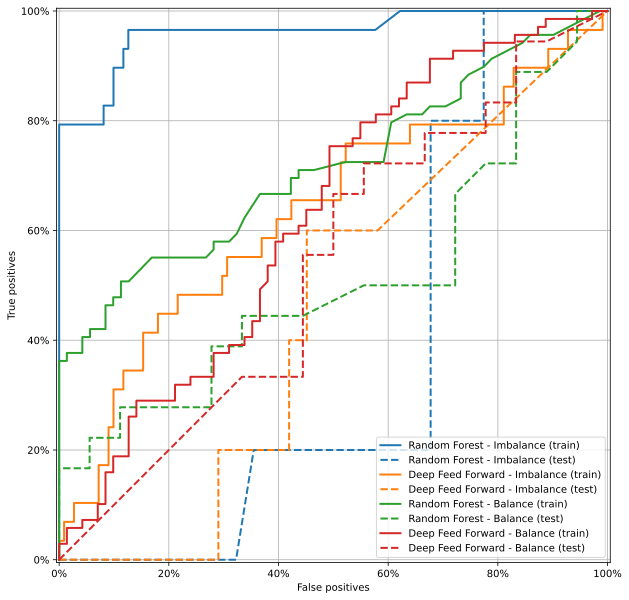

In [69]:
plt.figure(figsize=(10, 10))

for i, (name, result) in enumerate(results.items()):
    label_ind = None
    if name.endswith("Imbalance"):
        label_ind = 0
    if name.endswith("Balance"):
        label_ind = 1

    auc = plot_roc(
        f"{name} (train)",
        train_labels[:, label_ind],
        result["train"]["predictions"],
        color=f"C{i}",
    )
    print(
        f"{name}: Training Area Under ROC Curve: {result['train']['evaluation']['auc']} / {auc}"
    )
    interpret_auc(result["train"]["evaluation"]["auc"])

    auc = plot_roc(
        f"{name} (test)",
        test_labels[:, label_ind],
        result["test"]["predictions"],
        color=f"C{i}",
        linestyle="--",
    )
    print(
        f"{name}: Testing Area Under ROC Curve: {result['test']['evaluation']['auc']} / {auc}"
    )
    interpret_auc(result["test"]["evaluation"]["auc"])

plt.legend(loc="lower right")
plt.show()


Random Forest - Imbalance: Training Area Under PRC: 0.9213331341743469 / 0.9228277554632234
Random Forest - Imbalance: Testing Area Under PRC: 0.10350081324577332 / 0.1255407296351824
Deep Feed Forward - Imbalance: Training Area Under PRC: 0.3469541072845459 / 0.35805512377578297
Deep Feed Forward - Imbalance: Testing Area Under PRC: 0.11650775372982025 / 0.13751633986928105
Random Forest - Balance: Training Area Under PRC: 0.7777467370033264 / 0.7774836963485667
Random Forest - Balance: Testing Area Under PRC: 0.6035466194152832 / 0.6163242196472872
Deep Feed Forward - Balance: Training Area Under PRC: 0.5916275978088379 / 0.597897215180658
Deep Feed Forward - Balance: Testing Area Under PRC: 0.5118248462677002 / 0.5189645499828318


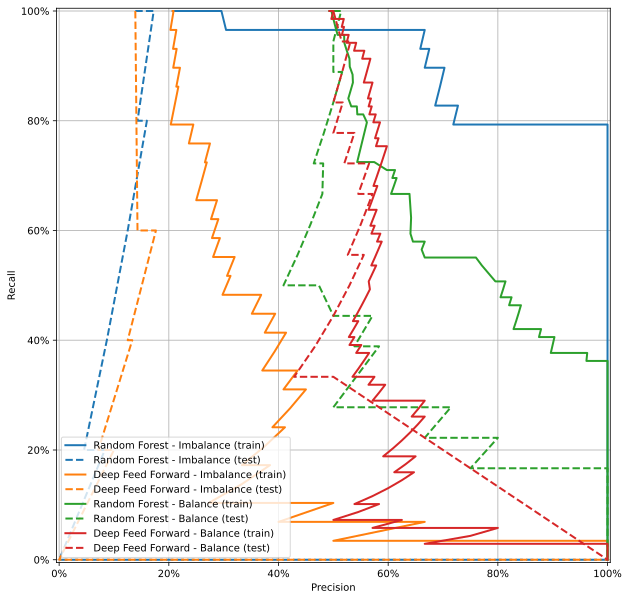

In [70]:
plt.figure(figsize=(10, 10))

for i, (name, result) in enumerate(results.items()):
    label_ind = None
    if name.endswith("Imbalance"):
        label_ind = 0
    if name.endswith("Balance"):
        label_ind = 1

    auc = plot_prc(
        f"{name} (train)",
        train_labels[:, label_ind],
        result["train"]["predictions"],
        color=f"C{i}",
    )
    print(
        f"{name}: Training Area Under PRC: {result['train']['evaluation']['prc']} / {auc}"
    )

    auc = plot_prc(
        f"{name} (test)",
        test_labels[:, label_ind],
        result["test"]["predictions"],
        color=f"C{i}",
        linestyle="--",
    )
    print(
        f"{name}: Testing Area Under PRC: {result['test']['evaluation']['prc']} / {auc}"
    )

plt.legend(loc="lower left")
plt.show()


Naive accuracy (imbalance): 0.8068181818181819
Naive - Imbalance: Testing Area Under ROC Curve: 0.5
Naive - Imbalance: Training Area Under ROC Curve: 0.5
Baseline - Imbalance: Testing Area Under ROC Curve: 0.5
Baseline - Imbalance: Training Area Under ROC Curve: 0.5


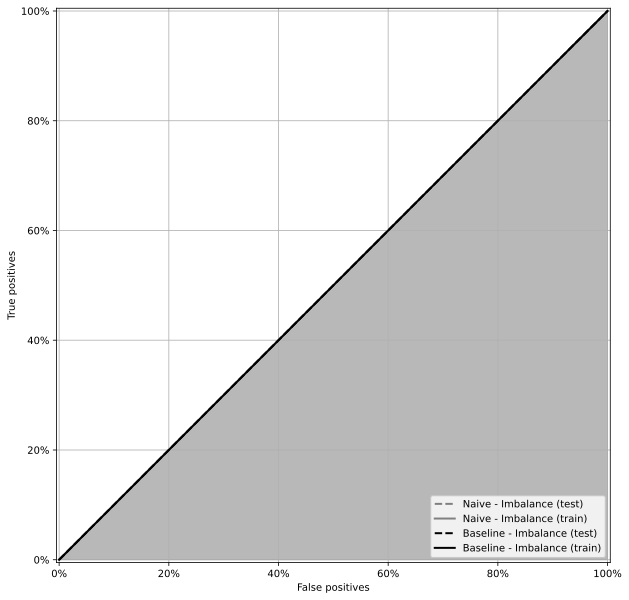

Naive - Imbalance: Testing Area Under PRC: 0.1388888888888889
Naive - Imbalance: Training Area Under PRC: 0.20714285714285716
Baseline - Imbalance: Testing Area Under PRC: 0.1388888888888889
Baseline - Imbalance: Training Area Under PRC: 0.20714285714285716


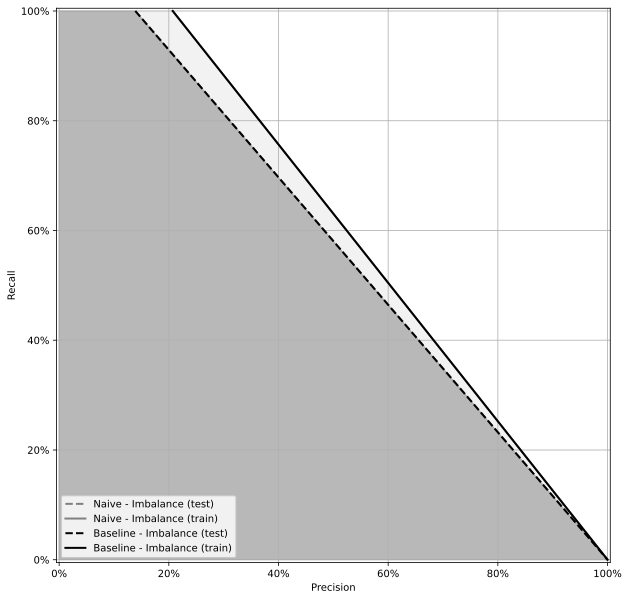

In [71]:
bias = dataset_df["survive_imbalance"].mean()
naive_imbalance = 1 if bias > 0.5 else 0
bias = max(bias, 1 - bias)
print(f"Naive accuracy (imbalance): {bias}")

plt.figure(figsize=(10, 10))

auc = plot_roc(
    f"Naive - Imbalance (test)",
    test_labels[:, 0],
    np.full(test_labels[:, 0].shape, naive_imbalance),
    color=f"grey",
    linestyle="--",
    plot_area=True,
    area_kwargs={
        "color": f"grey",
        "alpha": 0.5,
    },
)
print(f"Naive - Imbalance: Testing Area Under ROC Curve: {auc}")

auc = plot_roc(
    f"Naive - Imbalance (train)",
    train_labels[:, 0],
    np.full(train_labels[:, 0].shape, naive_imbalance),
    color=f"grey",
    plot_area=True,
    area_kwargs={
        "color": f"grey",
        "alpha": 0.1,
    },
)
print(f"Naive - Imbalance: Training Area Under ROC Curve: {auc}")

auc = plot_roc(
    f"Baseline - Imbalance (test)",
    test_labels[:, 0],
    np.full(test_labels[:, 0].shape, 0.5),
    color=f"black",
    linestyle="--",
)
print(f"Baseline - Imbalance: Testing Area Under ROC Curve: {auc}")

auc = plot_roc(
    f"Baseline - Imbalance (train)",
    train_labels[:, 0],
    np.full(train_labels[:, 0].shape, 0.5),
    color=f"black",
)
print(f"Baseline - Imbalance: Training Area Under ROC Curve: {auc}")

plt.legend(loc="lower right")
plt.show()

plt.figure(figsize=(10, 10))

auc = plot_prc(
    f"Naive - Imbalance (test)",
    test_labels[:, 0],
    np.full(test_labels[:, 0].shape, naive_imbalance),
    color=f"grey",
    linestyle="--",
    plot_area=True,
    area_kwargs={
        "color": f"grey",
        "alpha": 0.5,
    },
)
print(f"Naive - Imbalance: Testing Area Under PRC: {auc}")

auc = plot_prc(
    f"Naive - Imbalance (train)",
    train_labels[:, 0],
    np.full(train_labels[:, 0].shape, naive_imbalance),
    color=f"grey",
    plot_area=True,
    area_kwargs={
        "color": f"grey",
        "alpha": 0.1,
    },
)
print(f"Naive - Imbalance: Training Area Under PRC: {auc}")

auc = plot_prc(
    f"Baseline - Imbalance (test)",
    test_labels[:, 0],
    np.full(test_labels[:, 0].shape, 0.5),
    color=f"black",
    linestyle="--",
)
print(f"Baseline - Imbalance: Testing Area Under PRC: {auc}")

auc = plot_prc(
    f"Baseline - Imbalance (train)",
    train_labels[:, 0],
    np.full(train_labels[:, 0].shape, 0.5),
    color=f"black",
)
print(f"Baseline - Imbalance: Training Area Under PRC: {auc}")

plt.legend(loc="lower left")
plt.show()


Naive accuracy (balance): 0.5056818181818181
Naive - Balance: Testing Area Under ROC Curve: 0.5
Naive - Balance: Training Area Under ROC Curve: 0.5
Baseline - Balance: Testing Area Under ROC Curve: 0.5
Baseline - Balance: Training Area Under ROC Curve: 0.5


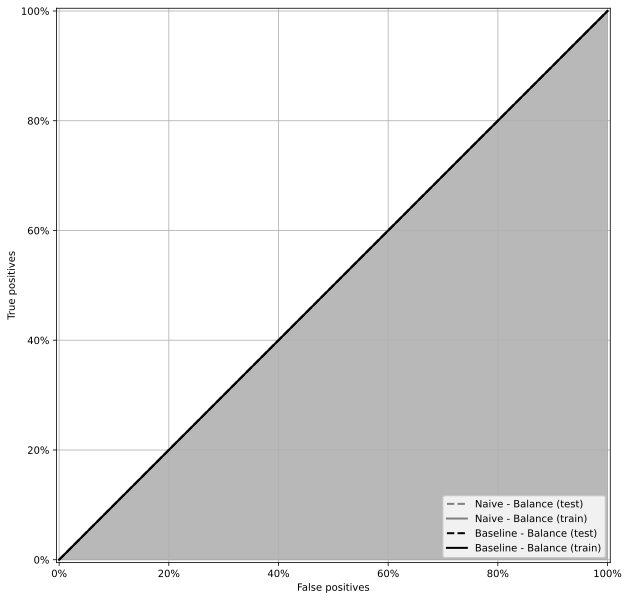

Naive - Balance: Testing Area Under PRC: 0.5
Naive - Balance: Training Area Under PRC: 0.4928571428571429
Baseline - Balance: Testing Area Under PRC: 0.1388888888888889
Baseline - Balance: Training Area Under PRC: 0.20714285714285716


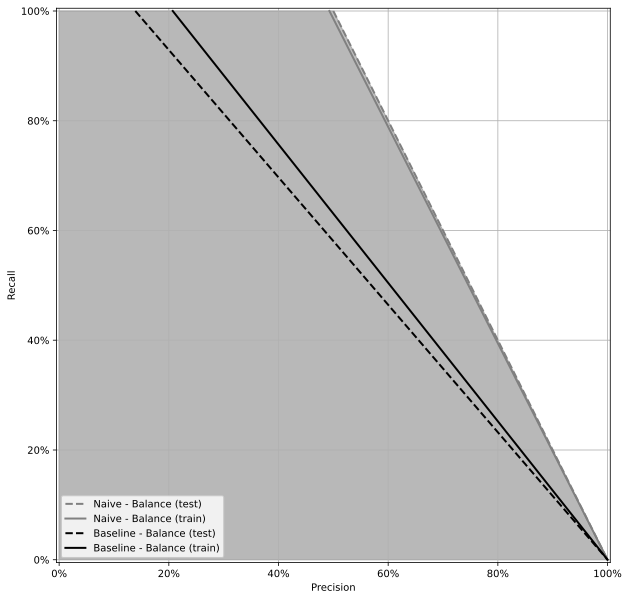

In [72]:
bias = dataset_df["survive_balance"].mean()
naive_balance = 1 if bias > 0.5 else 0
bias = max(bias, 1 - bias)
print(f"Naive accuracy (balance): {bias}")

plt.figure(figsize=(10, 10))

auc = plot_roc(
    f"Naive - Balance (test)",
    test_labels[:, 1],
    np.full(test_labels[:, 0].shape, naive_balance),
    color=f"grey",
    linestyle="--",
    plot_area=True,
    area_kwargs={
        "color": f"grey",
        "alpha": 0.5,
    },
)
print(f"Naive - Balance: Testing Area Under ROC Curve: {auc}")

auc = plot_roc(
    f"Naive - Balance (train)",
    train_labels[:, 1],
    np.full(train_labels[:, 0].shape, naive_balance),
    color=f"grey",
    plot_area=True,
    area_kwargs={
        "color": f"grey",
        "alpha": 0.1,
    },
)
print(f"Naive - Balance: Training Area Under ROC Curve: {auc}")

auc = plot_roc(
    f"Baseline - Balance (test)",
    test_labels[:, 0],
    np.full(test_labels[:, 0].shape, 0.5),
    color=f"black",
    linestyle="--",
)
print(f"Baseline - Balance: Testing Area Under ROC Curve: {auc}")

auc = plot_roc(
    f"Baseline - Balance (train)",
    train_labels[:, 0],
    np.full(train_labels[:, 0].shape, 0.5),
    color=f"black",
)
print(f"Baseline - Balance: Training Area Under ROC Curve: {auc}")

plt.legend(loc="lower right")
plt.show()

plt.figure(figsize=(10, 10))

auc = plot_prc(
    f"Naive - Balance (test)",
    test_labels[:, 1],
    np.full(test_labels[:, 0].shape, naive_balance),
    color=f"grey",
    linestyle="--",
    plot_area=True,
    area_kwargs={
        "color": f"grey",
        "alpha": 0.5,
    },
)
print(f"Naive - Balance: Testing Area Under PRC: {auc}")

auc = plot_prc(
    f"Naive - Balance (train)",
    train_labels[:, 1],
    np.full(train_labels[:, 0].shape, naive_balance),
    color=f"grey",
    plot_area=True,
    area_kwargs={
        "color": f"grey",
        "alpha": 0.1,
    },
)
print(f"Naive - Balance: Training Area Under PRC: {auc}")

auc = plot_prc(
    f"Baseline - Balance (test)",
    test_labels[:, 0],
    np.full(test_labels[:, 0].shape, 0.5),
    color=f"black",
    linestyle="--",
)
print(f"Baseline - Balance: Testing Area Under PRC: {auc}")

auc = plot_prc(
    f"Baseline - Balance (train)",
    train_labels[:, 0],
    np.full(train_labels[:, 0].shape, 0.5),
    color=f"black",
)
print(f"Baseline - Balance: Training Area Under PRC: {auc}")

plt.legend(loc="lower left")
plt.show()


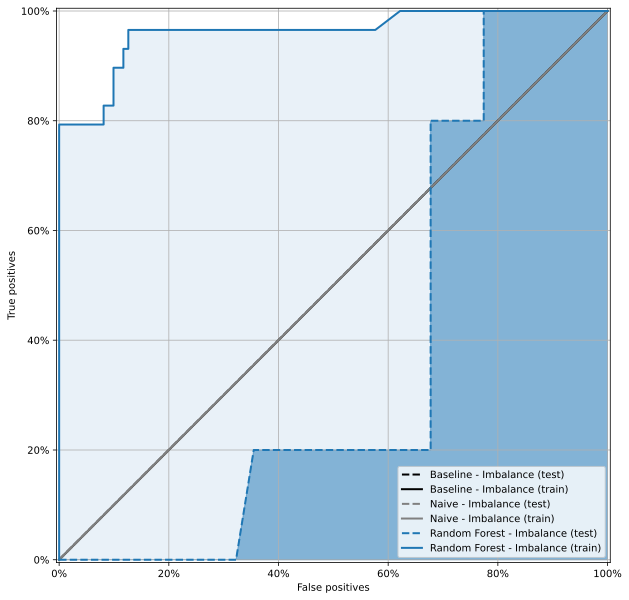

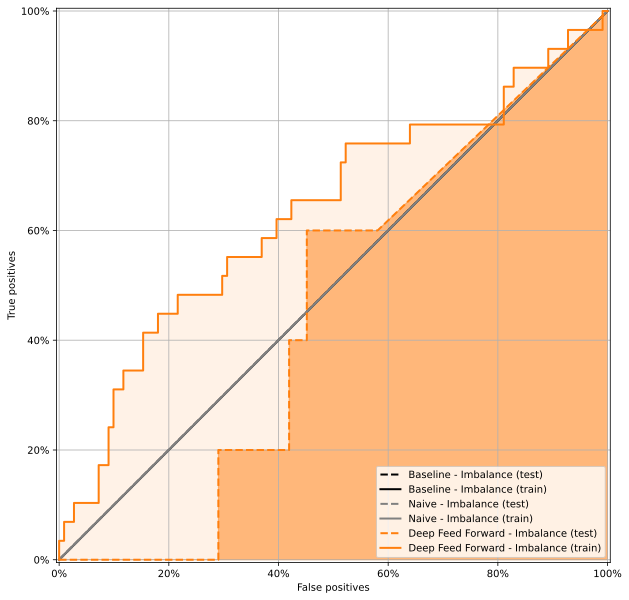

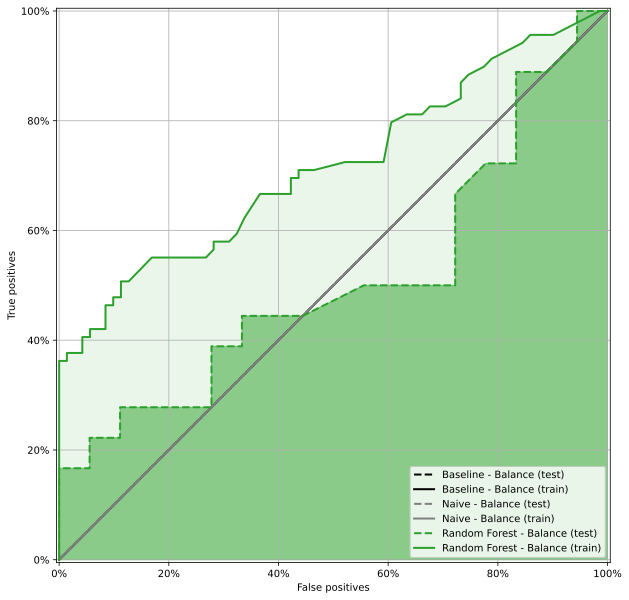

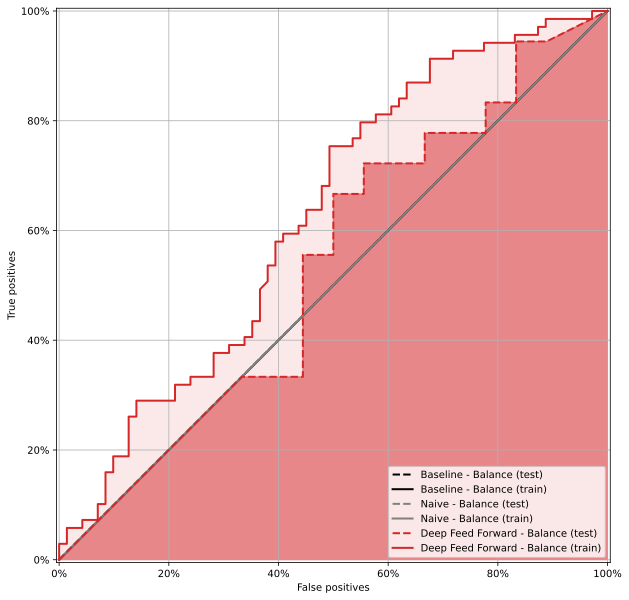

In [73]:
for i, (name, result) in enumerate(results.items()):
    plt.figure(figsize=(10, 10))
    label_ind = None
    if name.endswith("Imbalance"):
        label_ind = 0
        plot_roc(
            f"Baseline - Imbalance (test)",
            test_labels[:, label_ind],
            np.full(test_labels[:, label_ind].shape, 0.5),
            color=f"black",
            linestyle="--",
        )

        plot_roc(
            f"Baseline - Imbalance (train)",
            train_labels[:, label_ind],
            np.full(train_labels[:, label_ind].shape, 0.5),
            color=f"black",
        )

        plot_roc(
            f"Naive - Imbalance (test)",
            test_labels[:, label_ind],
            np.full(test_labels[:, label_ind].shape, naive_imbalance),
            color=f"grey",
            linestyle="--",
        )

        plot_roc(
            f"Naive - Imbalance (train)",
            train_labels[:, label_ind],
            np.full(train_labels[:, label_ind].shape, naive_imbalance),
            color=f"grey",
        )
    if name.endswith("Balance"):
        label_ind = 1
        plot_roc(
            f"Baseline - Balance (test)",
            test_labels[:, label_ind],
            np.full(test_labels[:, label_ind].shape, 0.5),
            color=f"black",
            linestyle="--",
        )

        plot_roc(
            f"Baseline - Balance (train)",
            train_labels[:, label_ind],
            np.full(train_labels[:, label_ind].shape, 0.5),
            color=f"black",
        )

        plot_roc(
            f"Naive - Balance (test)",
            test_labels[:, label_ind],
            np.full(test_labels[:, label_ind].shape, naive_balance),
            color=f"grey",
            linestyle="--",
        )

        plot_roc(
            f"Naive - Balance (train)",
            train_labels[:, label_ind],
            np.full(train_labels[:, label_ind].shape, naive_balance),
            color=f"grey",
        )

    plot_roc(
        f"{name} (test)",
        test_labels[:, label_ind],
        result["test"]["predictions"],
        color=f"C{i}",
        linestyle="--",
        plot_area=True,
        area_kwargs={
            "color": f"C{i}",
            "alpha": 0.5,
        },
    )

    plot_roc(
        f"{name} (train)",
        train_labels[:, label_ind],
        result["train"]["predictions"],
        color=f"C{i}",
        plot_area=True,
        area_kwargs={
            "color": f"C{i}",
            "alpha": 0.1,
        },
    )

    plt.legend(loc="lower right")
    plt.show()


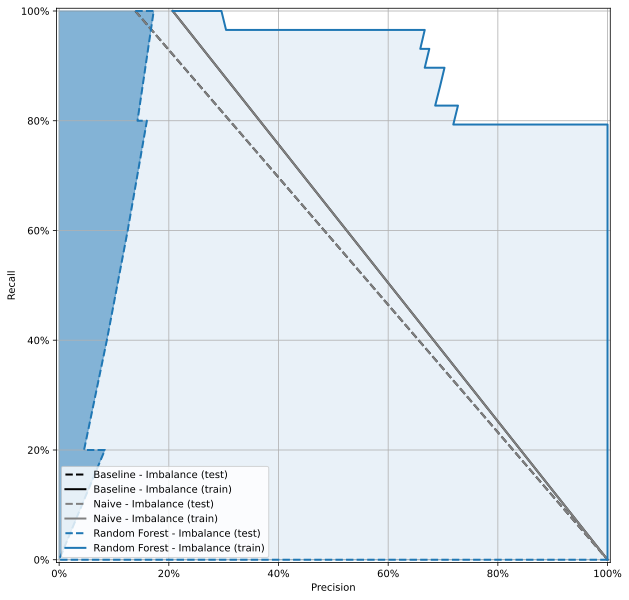

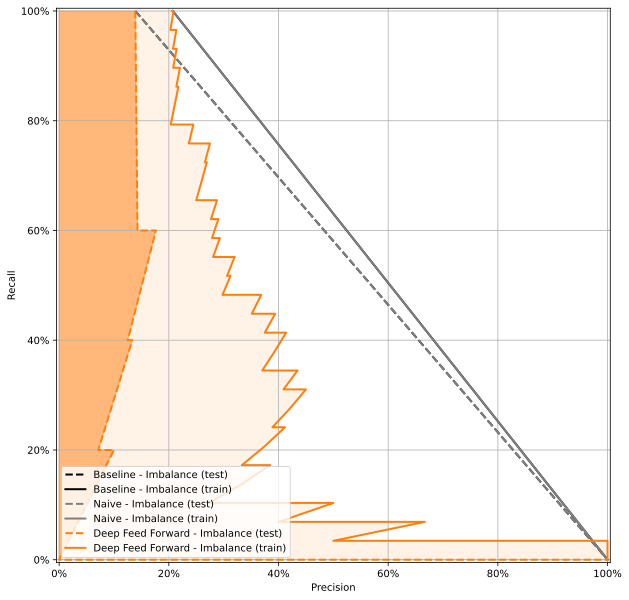

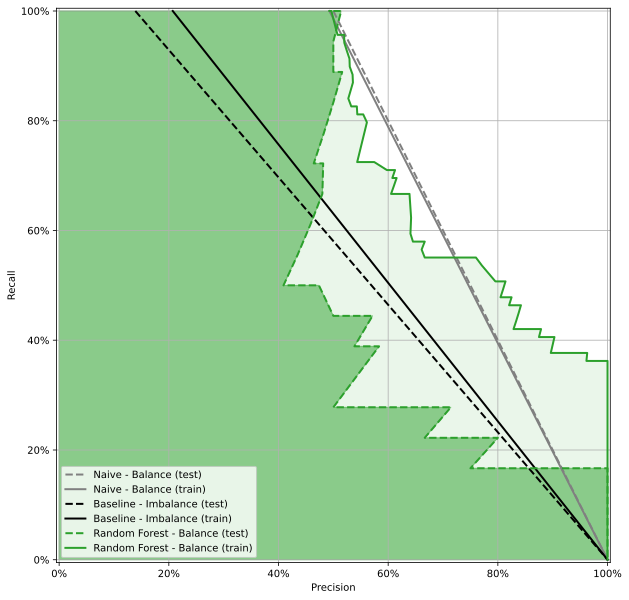

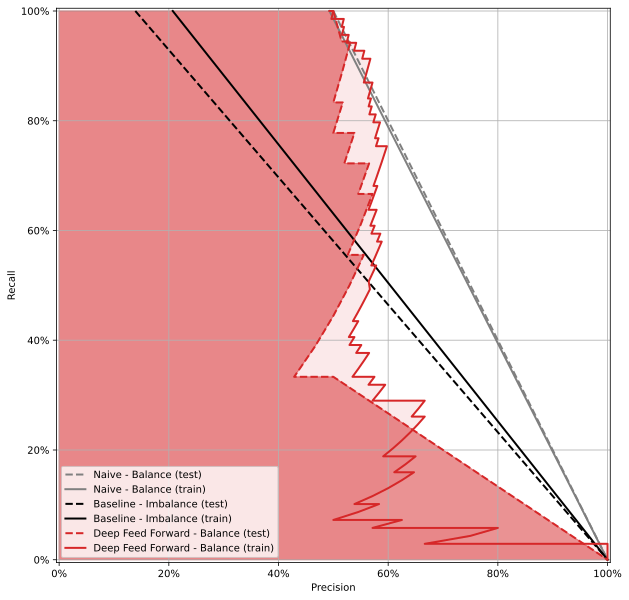

In [74]:
for i, (name, result) in enumerate(results.items()):
    plt.figure(figsize=(10, 10))
    label_ind = None
    if name.endswith("Imbalance"):
        label_ind = 0
        plot_prc(
            f"Baseline - Imbalance (test)",
            test_labels[:, label_ind],
            np.full(test_labels[:, label_ind].shape, 0.5),
            color=f"black",
            linestyle="--",
        )

        plot_prc(
            f"Baseline - Imbalance (train)",
            train_labels[:, label_ind],
            np.full(train_labels[:, label_ind].shape, 0.5),
            color=f"black",
        )

        plot_prc(
            f"Naive - Imbalance (test)",
            test_labels[:, label_ind],
            np.full(test_labels[:, label_ind].shape, naive_imbalance),
            color=f"grey",
            linestyle="--",
        )

        plot_prc(
            f"Naive - Imbalance (train)",
            train_labels[:, label_ind],
            np.full(train_labels[:, label_ind].shape, naive_imbalance),
            color=f"grey",
        )
    if name.endswith("Balance"):
        label_ind = 1

        plot_prc(
            f"Naive - Balance (test)",
            test_labels[:, 1],
            np.full(test_labels[:, 0].shape, naive_balance),
            color=f"grey",
            linestyle="--",
        )

        plot_prc(
            f"Naive - Balance (train)",
            train_labels[:, 1],
            np.full(train_labels[:, 0].shape, naive_balance),
            color=f"grey",
        )

        plot_prc(
            f"Baseline - Imbalance (test)",
            test_labels[:, 0],
            np.full(test_labels[:, 0].shape, 0.5),
            color=f"black",
            linestyle="--",
        )

        plot_prc(
            f"Baseline - Imbalance (train)",
            train_labels[:, 0],
            np.full(train_labels[:, 0].shape, 0.5),
            color=f"black",
        )

    plot_prc(
        f"{name} (test)",
        test_labels[:, label_ind],
        result["test"]["predictions"],
        color=f"C{i}",
        linestyle="--",
        plot_area=True,
        area_kwargs={
            "color": f"C{i}",
            "alpha": 0.5,
        },
    )

    plot_prc(
        f"{name} (train)",
        train_labels[:, label_ind],
        result["train"]["predictions"],
        color=f"C{i}",
        plot_area=True,
        area_kwargs={
            "color": f"C{i}",
            "alpha": 0.1,
        },
    )

    plt.legend(loc="lower left")
    plt.show()
